In [2]:
import os
from torchvision import datasets, transforms
from skimage.filters import frangi
import cv2
import numpy as np
from torch.utils.data import DataLoader, ConcatDataset
import torch
from PIL import Image, ImageDraw
from torch.utils.data import DataLoader,Subset
from torch.nn.utils import spectral_norm
import pandas as pd
from collections import Counter
import torch.nn as nn
import torch.optim as optim
import matplotlib.patches as patches
import torchvision.models as models
from torchvision.models.detection import fasterrcnn_resnet50_fpn
import torchvision.transforms as transforms
import random
from PIL import Image
import glob
from torch.utils.data import Dataset, DataLoader
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import torch.nn.functional as F
from keras.datasets import cifar10
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
import torchvision.transforms as transforms
from sklearn.metrics import precision_score, recall_score, accuracy_score

In [3]:
def ReadDisplayImage(image_path):
    im = cv2.imread(image_path)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY) 
    plt.imshow(cv2.cvtColor(im,cv2.IMREAD_GRAYSCALE))
    plt.show()
    return im


def DisplayImage(image):
    plt.imshow(cv2.cvtColor(image,cv2.IMREAD_GRAYSCALE))
    plt.show()
    return image

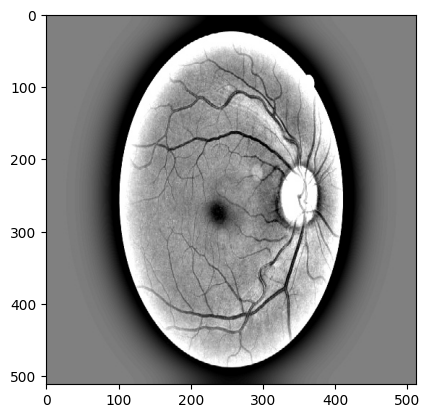

In [4]:
image1 = ReadDisplayImage('/kaggle/input/diabetic-retinopathy-balanced/content/Diabetic_Balanced_Data/train/0/10007_right.jpeg')

In [5]:
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
enhanced_img = clahe.apply(image1)

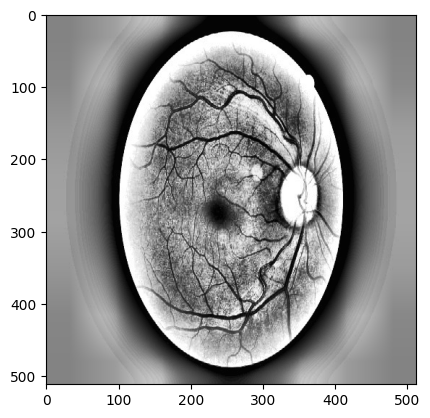

In [6]:
enhanced_img = DisplayImage(enhanced_img)

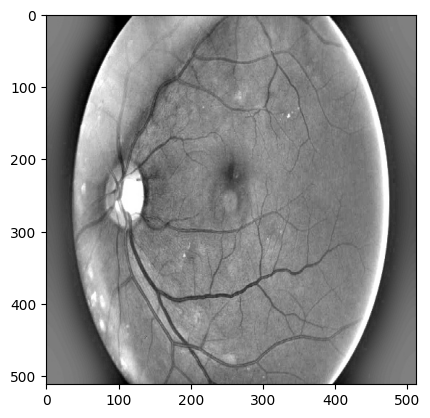

In [7]:
image2 = ReadDisplayImage('/kaggle/input/diabetic-retinopathy-balanced/content/Diabetic_Balanced_Data/train/2/1002_right.jpeg')

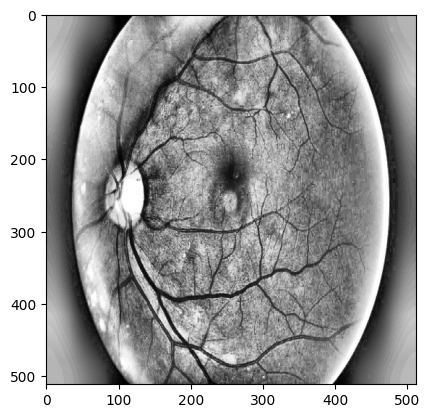

In [8]:
enhanced_img2 = clahe.apply(image2)
enhanced_img2 = DisplayImage(enhanced_img2)

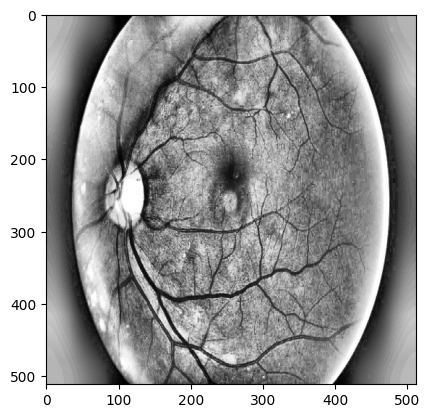

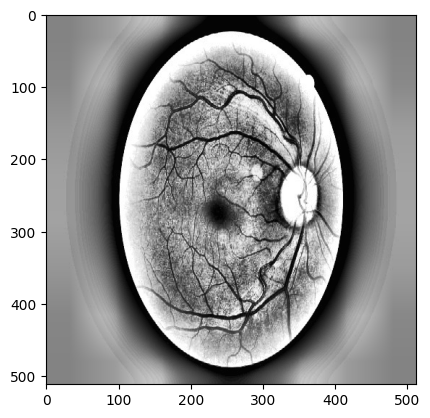

(array([[188, 188, 188, ..., 180, 180, 180],
        [188, 188, 188, ..., 180, 180, 180],
        [188, 188, 188, ..., 180, 180, 180],
        ...,
        [181, 181, 181, ..., 185, 185, 185],
        [181, 181, 181, ..., 185, 185, 185],
        [181, 181, 181, ..., 185, 185, 185]], dtype=uint8),
 array([[131, 131, 131, ..., 131, 131, 131],
        [131, 131, 131, ..., 131, 131, 131],
        [131, 131, 131, ..., 131, 131, 131],
        ...,
        [131, 131, 131, ..., 131, 131, 131],
        [131, 131, 131, ..., 131, 131, 131],
        [131, 131, 131, ..., 131, 131, 131]], dtype=uint8))

In [9]:
DisplayImage(enhanced_img2),DisplayImage(enhanced_img)

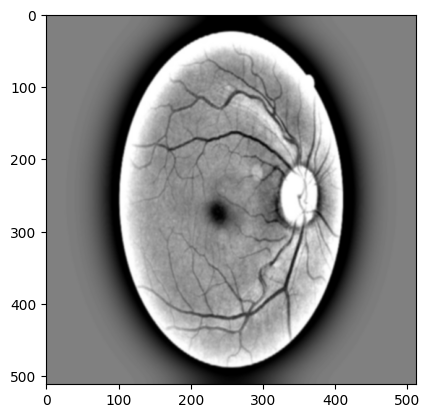

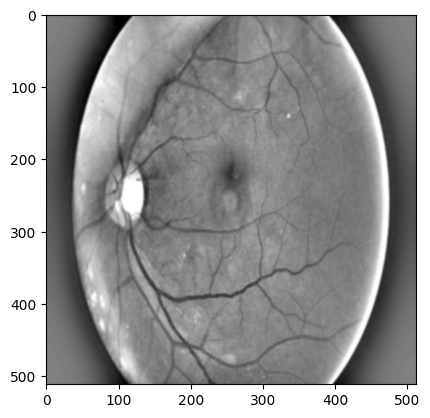

(array([[128, 128, 128, ..., 128, 128, 128],
        [128, 128, 128, ..., 128, 128, 128],
        [128, 128, 128, ..., 128, 128, 128],
        ...,
        [128, 128, 128, ..., 128, 128, 128],
        [128, 128, 128, ..., 128, 128, 128],
        [128, 128, 128, ..., 128, 128, 128]], dtype=uint8),
 array([[128, 128, 128, ..., 128, 128, 128],
        [128, 128, 128, ..., 128, 128, 128],
        [128, 128, 128, ..., 128, 128, 128],
        ...,
        [128, 128, 128, ..., 128, 128, 128],
        [128, 128, 128, ..., 128, 128, 128],
        [128, 128, 128, ..., 128, 128, 128]], dtype=uint8))

In [10]:
blurred1 = cv2.GaussianBlur(image1, (5,5), 0)
blurred2 = cv2.GaussianBlur(image2, (5,5), 0)
DisplayImage(blurred1),DisplayImage(blurred2)

In [11]:
def display_sample_images(folder_path):
    classes = sorted(os.listdir(folder_path))  # Get all class folders
    sample_images = []
    
    for class_name in classes:
        class_path = os.path.join(folder_path, class_name)
        if os.path.isdir(class_path):  # Ensure it's a directory
            images = os.listdir(class_path)
            if images:
                random_image = random.choice(images)  # Pick a random image
                img_path = os.path.join(class_path, random_image)
                img = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Read image in color
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
                sample_images.append((class_name, img))
    
    # Display images
    plt.figure(figsize=(15, 5))
    for i, (class_name, img) in enumerate(sample_images):
        plt.subplot(1, len(sample_images), i + 1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis("off")
    
    plt.show()

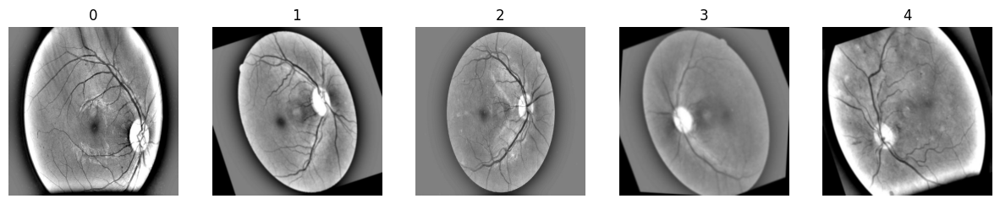

In [12]:
display_sample_images('/kaggle/input/diabetic-retinopathy-balanced/content/Diabetic_Balanced_Data/train')

In [13]:
def load_random_images(root_dir):
    """Loads one random image from each class folder."""
    images = {}
    for class_folder in sorted(os.listdir(root_dir)):
        class_path = os.path.join(root_dir, class_folder)
        if os.path.isdir(class_path):
            image_files = [f for f in os.listdir(class_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
            if image_files:
                random_image = random.choice(image_files)
                img_path = os.path.join(class_path, random_image)
                images[class_folder] = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    return images

In [14]:
def display_segmented_images(images):
    """Displays original and segmented images side by side."""
    fig, axes = plt.subplots(2, len(images), figsize=(15, 6))
    
    for idx, (label, img) in enumerate(images.items()):
        segmented = segment_blood_vessels(img)
        
        # Original image
        axes[0, idx].imshow(img, cmap='gray')
        axes[0, idx].set_title(f"Original - {label}")
        axes[0, idx].axis('off')
        
        # Segmented image
        axes[1, idx].imshow(segmented, cmap='gray')
        axes[1, idx].set_title(f"Segmented - {label}")
        axes[1, idx].axis('off')
    
    plt.tight_layout()
    plt.show()


In [15]:
def plot_histogram(image):
    a = np.array(image.getdata())

    fig, ax = plt.subplots(figsize=(10,4))
    n,bins,patches = ax.hist(a, bins=range(256), edgecolor='none')
    ax.set_title("histogram")
    ax.set_xlim(0,255)
    
    
    cm = plt.cm.get_cmap('cool')
    norm = matplotlib.colors.Normalize(vmin=bins.min(), vmax=bins.max())
    for b,p in zip(bins,patches):
        p.set_facecolor(cm(norm(b)))
    plt.show()

In [16]:
def segment_blood_vessels(image):
    #clahe = cv2.createCLAHE(clipLimit=8.0, tileGridSize=(4, 4))
    #clahe = clahe.apply(image)
    #kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 9)) 
    #tophat = cv2.morphologyEx(clahe, cv2.MORPH_TOPHAT, kernel)
    if len(image.shape) == 3:  # Convert RGB to grayscale
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    mask = image < 100
    clahe_applied = clahe.apply(image)  
    enhanced = np.where(mask, clahe_applied, image)  

    blurred = cv2.GaussianBlur(enhanced, (5, 5), 0)

    laplacian = cv2.Laplacian(blurred, cv2.CV_64F, ksize=3)

    laplacian = np.clip((laplacian - laplacian.min()) / (laplacian.max() - laplacian.min()) * 255, 0, 255)

    return laplacian.astype(np.uint8) 

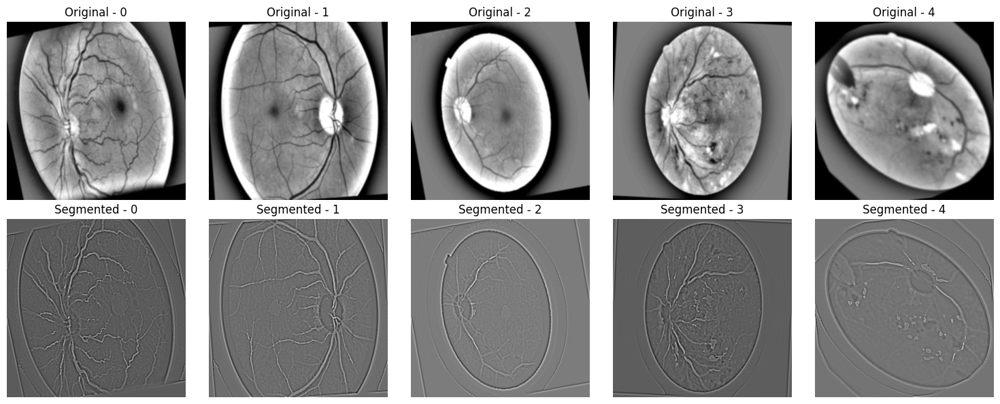

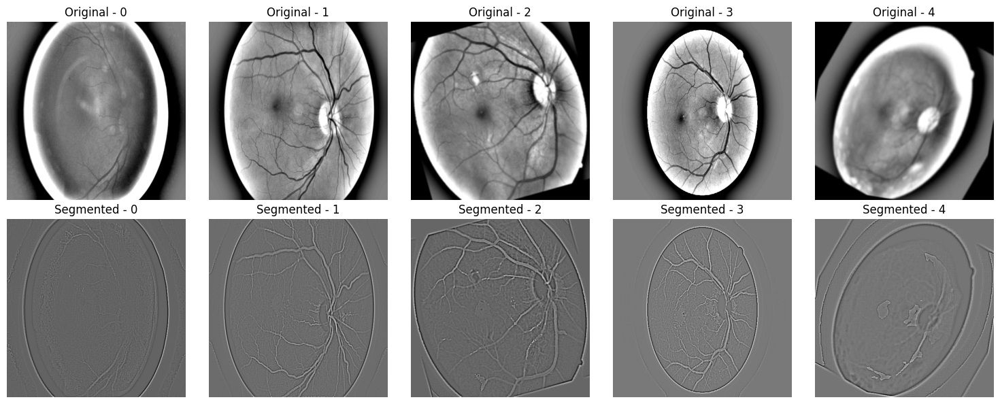

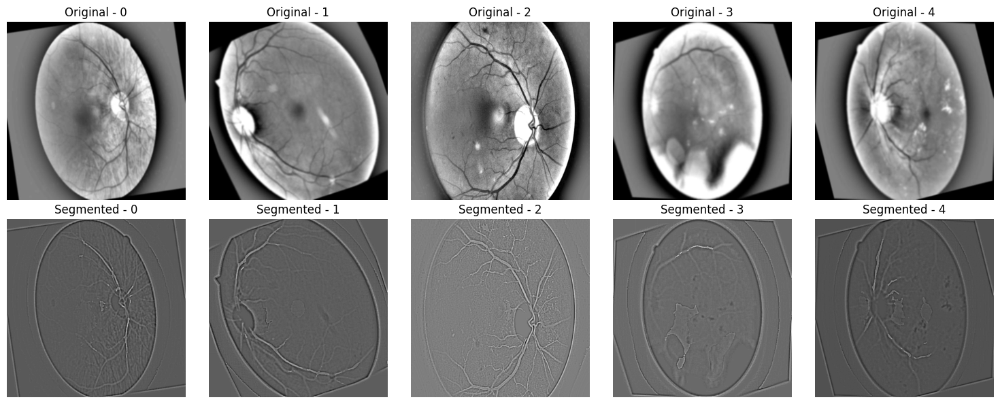

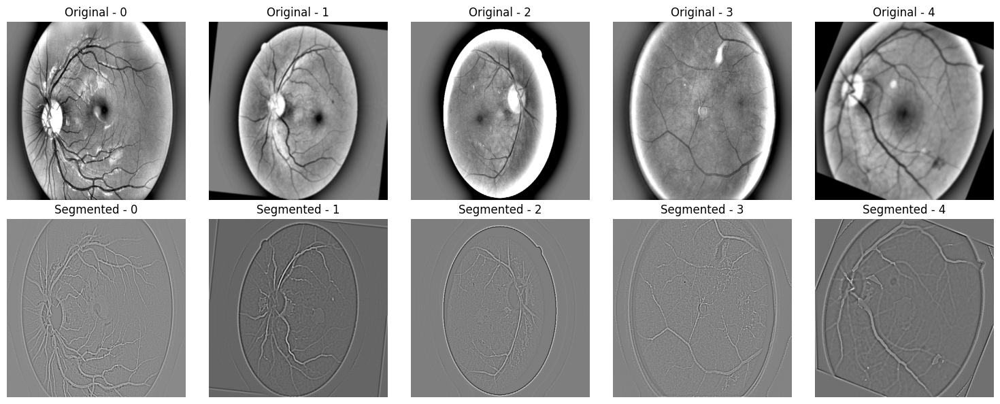

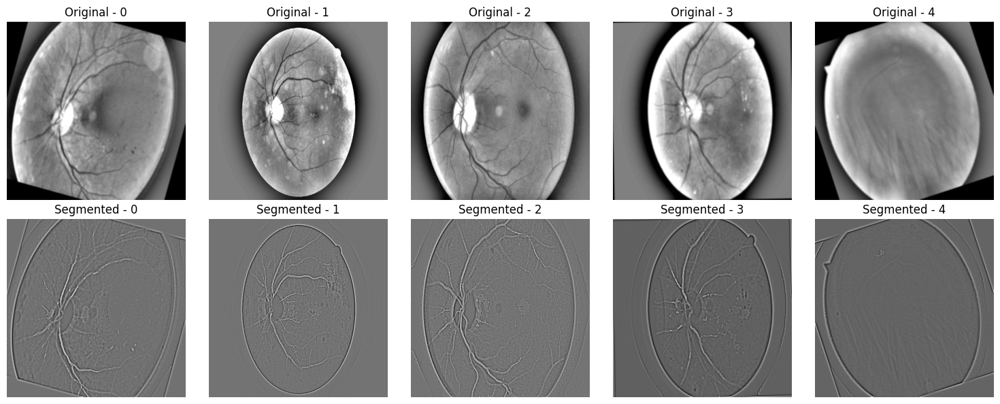

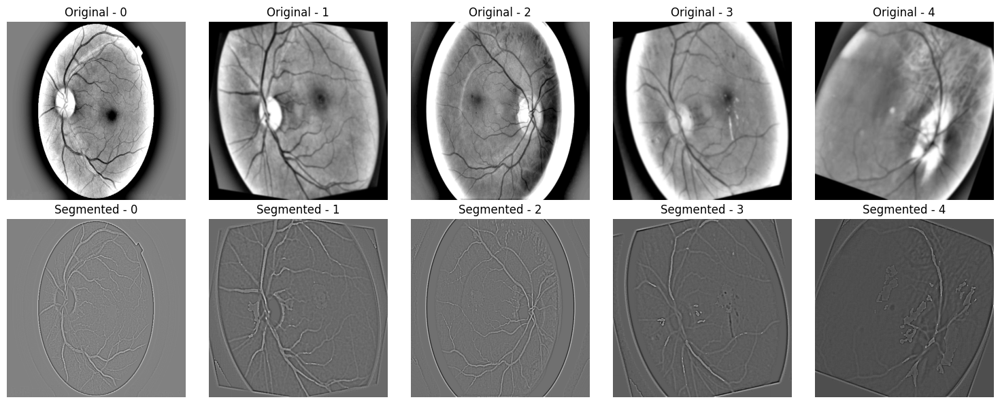

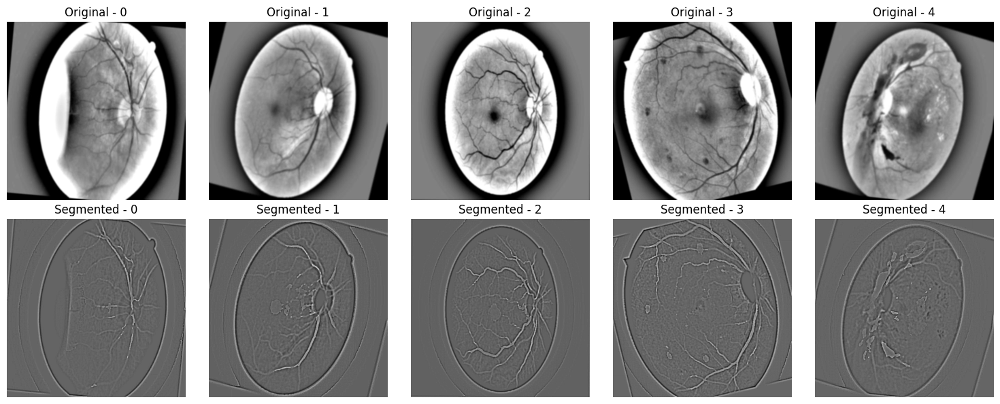

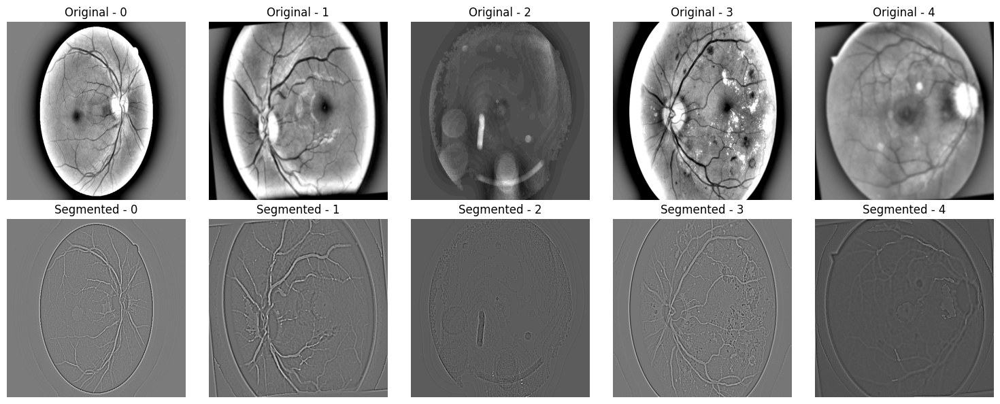

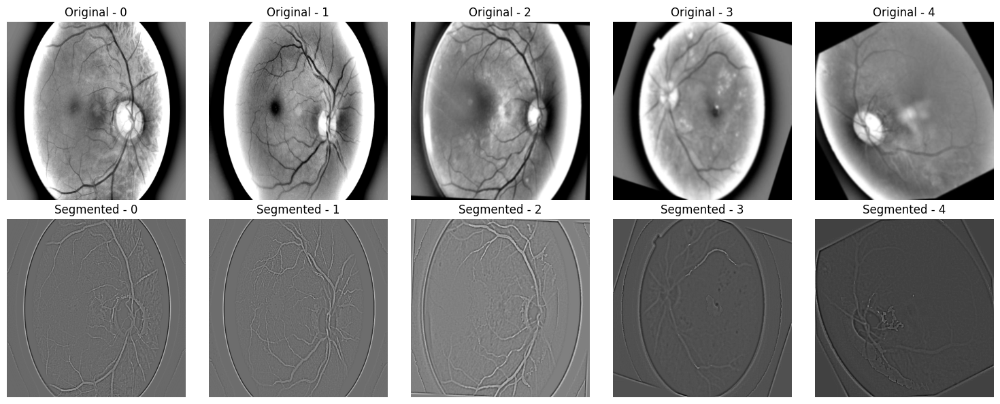

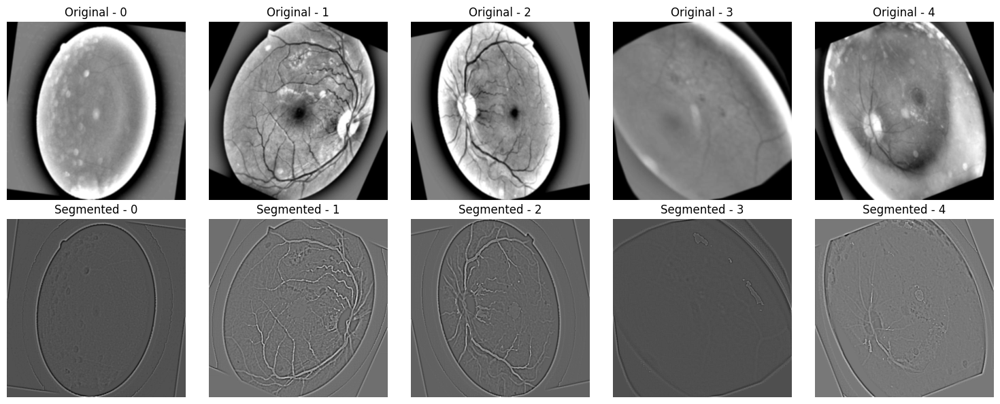

In [17]:
root_dir = "/kaggle/input/diabetic-retinopathy-balanced/content/Diabetic_Balanced_Data/train"
for i in range(10):
    random_images = load_random_images(root_dir)
    display_segmented_images(random_images)

In [18]:
df = pd.read_csv('/kaggle/input/diabetic-retinopathy-resized/trainLabels.csv')
df[df['level']==4]

,image,level
6,16_left,4
7,16_right,4
184,217_left,4
185,217_right,4
252,294_left,4
...,...,...
34914,44100_left,4
35046,44247_left,4
35047,44247_right,4
35048,44249_left,4


In [19]:
from torchvision.datasets import ImageFolder
class VesselSegmentationTransform:
    def __call__(self, img):
        img = np.array(img)  # Convert PIL image to numpy array
        img = segment_blood_vessels(img)  # Apply your function
        return Image.fromarray(img)  # Convert back to PIL image

# Define transforms with your function included
transform = transforms.Compose([
    VesselSegmentationTransform(), 
    transforms.Resize((224, 224)),
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.5], std=[0.5]) 
])

train_dir = "/kaggle/input/diabetic-retinopathy-balanced/content/Diabetic_Balanced_Data/train"  
test_dir = "/kaggle/input/diabetic-retinopathy-balanced/content/Diabetic_Balanced_Data/test"  


class VesselSegmentationTransform:
    def __call__(self, img):
        img = np.array(img)  
        img = segment_blood_vessels(img) 
        return Image.fromarray(img)  

transform = transforms.Compose([
    VesselSegmentationTransform(),  
    transforms.Grayscale(num_output_channels=1),  # Convert to grayscale
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize
])


train_dataset = ImageFolder(root=train_dir, transform=transform)
test_dataset = ImageFolder(root=test_dir, transform=transform)

In [20]:
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Check a sample batch
images, labels = next(iter(train_loader))
print(f"Batch shape: {images.shape}, Labels: {labels}")

Batch shape: torch.Size([32, 1, 512, 512]), Labels: tensor([4, 1, 0, 1, 4, 4, 2, 4, 3, 1, 0, 3, 3, 0, 2, 1, 2, 3, 1, 2, 0, 3, 0, 4,
        1, 0, 0, 4, 4, 2, 0, 3])


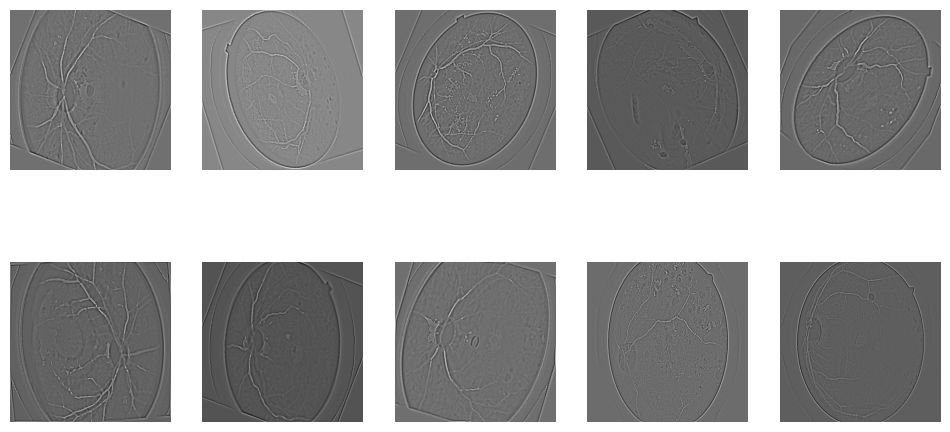

In [21]:
data_iter = iter(train_loader)
images, labels = next(data_iter)

# Convert tensor images to numpy for visualization
fig, axes = plt.subplots(2, 5, figsize=(12, 6))
for i, ax in enumerate(axes.flat):
    img = images[i].squeeze(0).numpy()  # Convert to numpy
    ax.imshow(img, cmap='gray')  # Show in grayscale
    ax.axis("off")  # Hide axis

plt.show()


In [22]:
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 149MB/s] 


In [23]:
in_features = model.fc.in_features  
model.fc = nn.Linear(in_features, 5)

print(model.fc)

Linear(in_features=2048, out_features=5, bias=True)


In [24]:
model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
model.conv1

Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

In [26]:
criterion = nn.CrossEntropyLoss() 
optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, betas=(0.8, 0.98),weight_decay=1e-4)

In [27]:
from tqdm import tqdm
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        model.train()  # Set model to training mode
        running_loss = 0.0
        correct, total = 0, 0

        # Use tqdm for progress bar
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")

        for images, labels in progress_bar:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()  # Clear previous gradients
            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Compute loss
            loss.backward()  # Backpropagation
            optimizer.step()  # Update weights

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Update tqdm description with live loss and accuracy
            progress_bar.set_postfix(loss=f"{running_loss/total:.4f}", acc=f"{(100 * correct/total):.2f}%")

        train_acc = 100 * correct / total
        val_acc = validate(model, val_loader)  # Validate on test set

        print(f"\nEpoch {epoch+1}/{num_epochs} - Loss: {running_loss/len(train_loader):.4f}, Train Acc: {train_acc:.2f}%, Val Acc: {val_acc:.2f}%")

# Validation function
def validate(model, val_loader):
    model.eval()  # Set to evaluation mode
    correct, total = 0, 0

    with torch.no_grad():  # No gradient calculation for validation
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return 100 * correct / total  # Return accuracy %

In [28]:
train_model(model, train_loader, test_loader, criterion, optimizer, num_epochs=100)

Epoch 1/100: 100%|██████████| 1088/1088 [21:45<00:00,  1.20s/it, acc=51.29%, loss=0.0345]



Epoch 1/100 - Loss: 1.1026, Train Acc: 51.29%, Val Acc: 52.12%


Epoch 2/100: 100%|██████████| 1088/1088 [19:50<00:00,  1.09s/it, acc=58.84%, loss=0.0298]



Epoch 2/100 - Loss: 0.9542, Train Acc: 58.84%, Val Acc: 57.21%


Epoch 3/100: 100%|██████████| 1088/1088 [19:43<00:00,  1.09s/it, acc=62.35%, loss=0.0274]



Epoch 3/100 - Loss: 0.8760, Train Acc: 62.35%, Val Acc: 58.88%


Epoch 4/100: 100%|██████████| 1088/1088 [19:33<00:00,  1.08s/it, acc=66.57%, loss=0.0246]



Epoch 4/100 - Loss: 0.7859, Train Acc: 66.57%, Val Acc: 60.71%


Epoch 5/100: 100%|██████████| 1088/1088 [19:36<00:00,  1.08s/it, acc=71.14%, loss=0.0217]



Epoch 5/100 - Loss: 0.6939, Train Acc: 71.14%, Val Acc: 60.71%


Epoch 6/100: 100%|██████████| 1088/1088 [19:38<00:00,  1.08s/it, acc=74.91%, loss=0.0187]



Epoch 6/100 - Loss: 0.5982, Train Acc: 74.91%, Val Acc: 57.13%


Epoch 7/100: 100%|██████████| 1088/1088 [19:41<00:00,  1.09s/it, acc=78.55%, loss=0.0163]



Epoch 7/100 - Loss: 0.5210, Train Acc: 78.55%, Val Acc: 60.37%


Epoch 8/100: 100%|██████████| 1088/1088 [19:26<00:00,  1.07s/it, acc=81.23%, loss=0.0141]



Epoch 8/100 - Loss: 0.4524, Train Acc: 81.23%, Val Acc: 58.88%


Epoch 9/100: 100%|██████████| 1088/1088 [19:26<00:00,  1.07s/it, acc=83.89%, loss=0.0124]



Epoch 9/100 - Loss: 0.3968, Train Acc: 83.89%, Val Acc: 57.05%


Epoch 10/100: 100%|██████████| 1088/1088 [19:23<00:00,  1.07s/it, acc=86.70%, loss=0.0105]



Epoch 10/100 - Loss: 0.3354, Train Acc: 86.70%, Val Acc: 58.62%


Epoch 11/100:   0%|          | 2/1088 [00:03<28:10,  1.56s/it, acc=90.62%, loss=0.0086]


KeyboardInterrupt: 

In [29]:
torch.save(model.state_dict(), "/kaggle/working/resnet50.pth")
from IPython.display import FileLink
FileLink("/kaggle/working/resnet50.pth")

/kaggle/working/resnet50.pth

In [30]:
test_dir = "/kaggle/input/diabetic-retinopathy-balanced/content/Diabetic_Balanced_Data/val"  
transform = transforms.Compose([
    VesselSegmentationTransform(),  
    transforms.Grayscale(num_output_channels=1),  # Convert to grayscale
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize
])


test_dataset = ImageFolder(root=test_dir, transform=transform)


test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(model, data_loader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)

    # Plot confusion matrix using Seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()






In [32]:
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score
def evaluate_model(model, data_loader, device):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []

    with torch.no_grad():  # No need to track gradients
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)  # Get the predicted class

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute Precision, Recall, and F1-score
    precision = precision_score(all_labels, all_preds, average='macro')
    recall = recall_score(all_labels, all_preds, average='macro')
    f1 = f1_score(all_labels, all_preds, average='macro')

    print("Classification Report:\n", classification_report(all_labels, all_preds))
    return precision, recall, f1

In [34]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class_names = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative DR']  # Modify as per your dataset

precision, recall, f1 = evaluate_model(model, test_loader, device)
print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")



Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.42      0.50      2000
           1       0.46      0.69      0.55      1940
           2       0.46      0.53      0.49      2000
           3       0.73      0.65      0.69      2000
           4       0.87      0.66      0.75      2000

    accuracy                           0.59      9940
   macro avg       0.62      0.59      0.60      9940
weighted avg       0.63      0.59      0.60      9940

Precision: 0.6245, Recall: 0.5910, F1-score: 0.5955


NameError: name 'val_loader' is not defined

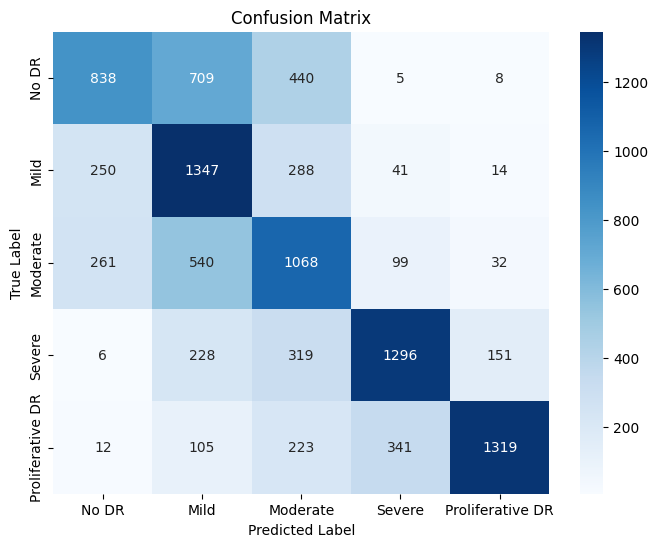

In [35]:
plot_confusion_matrix(model, test_loader, device, class_names)

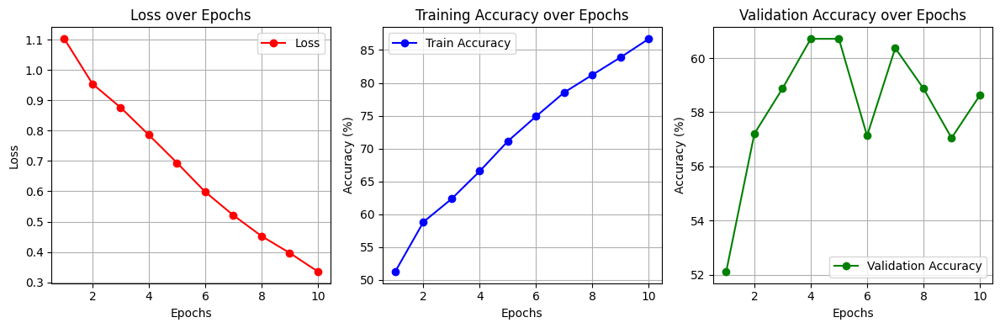

In [36]:
epochs = list(range(1, 11))
loss = [1.1026, 0.9542, 0.8760, 0.7859, 0.6939, 0.5982, 0.5210, 0.4524, 0.3968, 0.3354]
train_acc = [51.29, 58.84, 62.35, 66.57, 71.14, 74.91, 78.55, 81.23, 83.89, 86.70]
val_acc = [52.12, 57.21, 58.88, 60.71, 60.71, 57.13, 60.37, 58.88, 57.05, 58.62]

# Create the plots
plt.figure(figsize=(12, 4))

# Plot Loss
plt.subplot(1, 3, 1)
plt.plot(epochs, loss, marker='o', linestyle='-', color='red', label="Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss over Epochs")
plt.legend()
plt.grid()

# Plot Training Accuracy
plt.subplot(1, 3, 2)
plt.plot(epochs, train_acc, marker='o', linestyle='-', color='blue', label="Train Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy (%)")
plt.title("Training Accuracy over Epochs")
plt.legend()
plt.grid()

# Plot Validation Accuracy
plt.subplot(1, 3, 3)
plt.plot(epochs, val_acc, marker='o', linestyle='-', color='green', label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy (%)")
plt.title("Validation Accuracy over Epochs")
plt.legend()
plt.grid()

# Show the plots
plt.tight_layout()
plt.show()
